# End-to-End Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1.Problem

Identifing the breed of a dog given an image of a dog.

When i'm sitting at the cafe and i take a photo of a dog, I want to know what breed of dog it is.

## 2.Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3.Evaluation

The Evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview

##4.Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learing/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set(these images have labels).
* There are around 10,000+ images in the test set(these images have no labels, because we'll want to predict them).

In [2]:
#Unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/dog-breed-identification.zip" -d "drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/"

Get Our Workspace Ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [3]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version: ",tf.__version__)

TF version:  2.19.0


In [4]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("Hub Version: ",hub.__version__)

# Check for GPU availability
print("GPU","available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

Hub Version:  0.16.1
GPU not available :(


## Getting our data ready (turning into Tensors)

with all machine learning models, our data has to be in numeric format. So that's what we'll be doing first. Turning our images into Tensors(numeric representations).

Let's start by accessing our data and checking out the labels.


In [5]:
# Checkout the lables of our data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

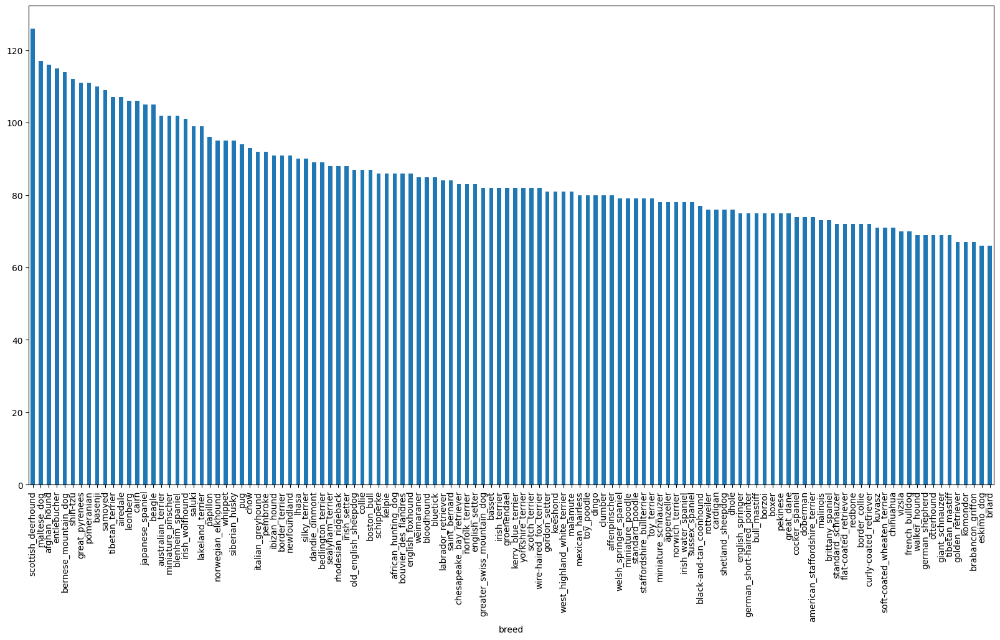

In [7]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [8]:
labels_csv['breed'].value_counts().median()

82.0

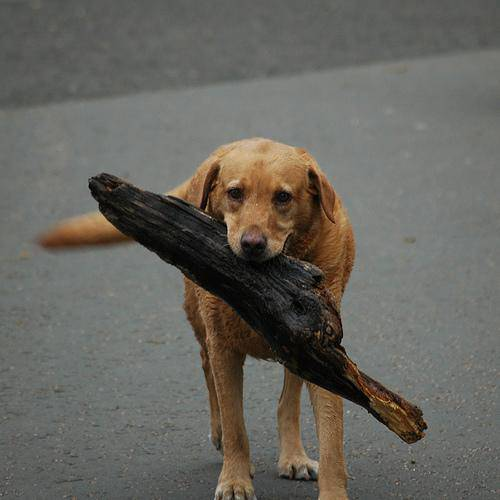

In [9]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

### Getting images and their labels

Let's get a listof all of our image file pathnames.

In [10]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [11]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/" + fname +'.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

['drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/0042188c895a2f14ef6

In [12]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! proceed.


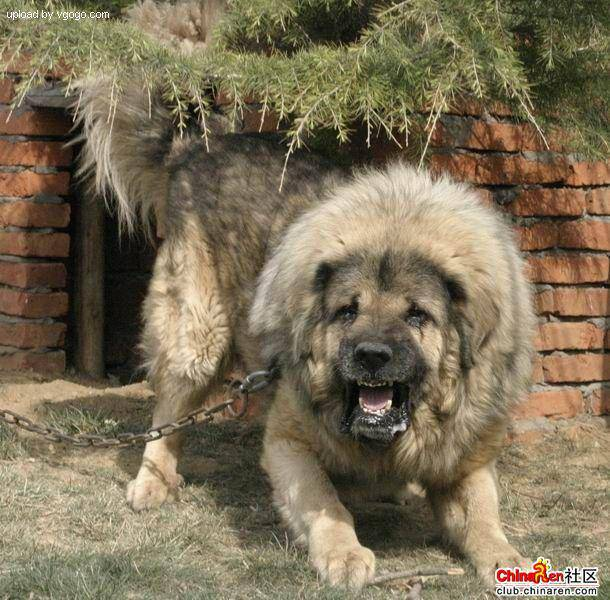

In [13]:
# One more check
Image(filenames[9000])

In [14]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [15]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [19]:
len(labels)

10222

In [16]:
# See if number of labels matched the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of lables does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [18]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [19]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
len(labels)

10222

In [21]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_labels)

10222

In [23]:
# Example: Turning boolean array into integers
print(labels[0]) # original lable
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from kaggle doesn't come with a validation set, we're going to create our own.

In [25]:
# Set up X & y variables
X = filenames
y = boolean_labels

In [26]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [27]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [28]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train),len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [29]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, F

## Preprocessing Images(Turning images into Tensors)

To Preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Resize the 'image' to be a shape of (224,224)
5. Return the modified image

Before we do, let's see what importing an image looks like.

In [30]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[142])
image.shape

(333, 500, 3)

In [31]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

array([[[27, 61, 10],
        [35, 69, 19],
        [37, 70, 25],
        ...,
        [74, 89, 68],
        [74, 89, 68],
        [74, 89, 68]],

       [[28, 60, 10],
        [41, 73, 24],
        [47, 78, 34],
        ...,
        [79, 91, 71],
        [75, 87, 67],
        [71, 83, 63]],

       [[27, 55,  7],
        [44, 71, 26],
        [53, 82, 38],
        ...,
        [90, 94, 79],
        [83, 87, 72],
        [77, 81, 66]],

       ...,

       [[64, 89, 68],
        [56, 81, 59],
        [58, 82, 58],
        ...,
        [53, 73, 36],
        [48, 68, 31],
        [50, 70, 33]],

       [[49, 68, 49],
        [58, 77, 57],
        [68, 87, 65],
        ...,
        [64, 84, 47],
        [59, 79, 44],
        [50, 70, 33]],

       [[44, 57, 40],
        [64, 79, 60],
        [77, 92, 71],
        ...,
        [54, 76, 40],
        [51, 72, 39],
        [32, 54, 18]]], dtype=uint8)
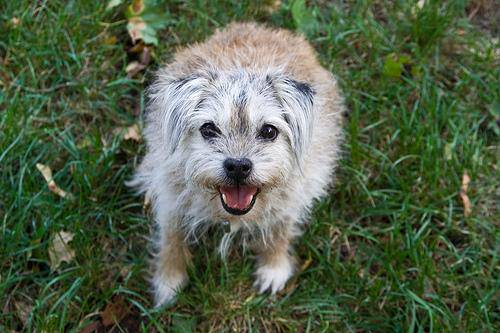

In [32]:
image

In [33]:
image[:2]

array([[[27, 61, 10],
        [35, 69, 19],
        [37, 70, 25],
        ...,
        [74, 89, 68],
        [74, 89, 68],
        [74, 89, 68]],

       [[28, 60, 10],
        [41, 73, 24],
        [47, 78, 34],
        ...,
        [79, 91, 71],
        [75, 87, 67],
        [71, 83, 63]]], dtype=uint8)

In [34]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[27, 61, 10],
        [35, 69, 19],
        [37, 70, 25],
        ...,
        [74, 89, 68],
        [74, 89, 68],
        [74, 89, 68]],

       [[28, 60, 10],
        [41, 73, 24],
        [47, 78, 34],
        ...,
        [79, 91, 71],
        [75, 87, 67],
        [71, 83, 63]]], dtype=uint8)>

Now we've seem what an image looks like as a Tensor, lets make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the 'image' to be a shape of (224,224)
6. Return the modified image

In [35]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size =IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels(Red, Green , Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (244, 244)
  image = tf.image.resize( image, size= [IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go..
they all might not fit into memory.

So that's why we do about 32(this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
'(image, label)'.

In [36]:
# create a simple function to return a tuple (image,label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  '''
  image = process_image(image_path)
  return image, label

In [37]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors
in the form `(image,label)`, let's make a function to turn all of our data (x & y) into batches!

In [38]:
# Define a batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X,y=None, batch_size = BATCH_SIZE, valid_data = False, test_data= False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print('creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('creating training data batches .... ')
    # Turn fiilepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function faster than shuffling images
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [39]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

creating training data batches .... 
creating validation data batches...


In [40]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!



In [41]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  # setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots(5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')


In [46]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

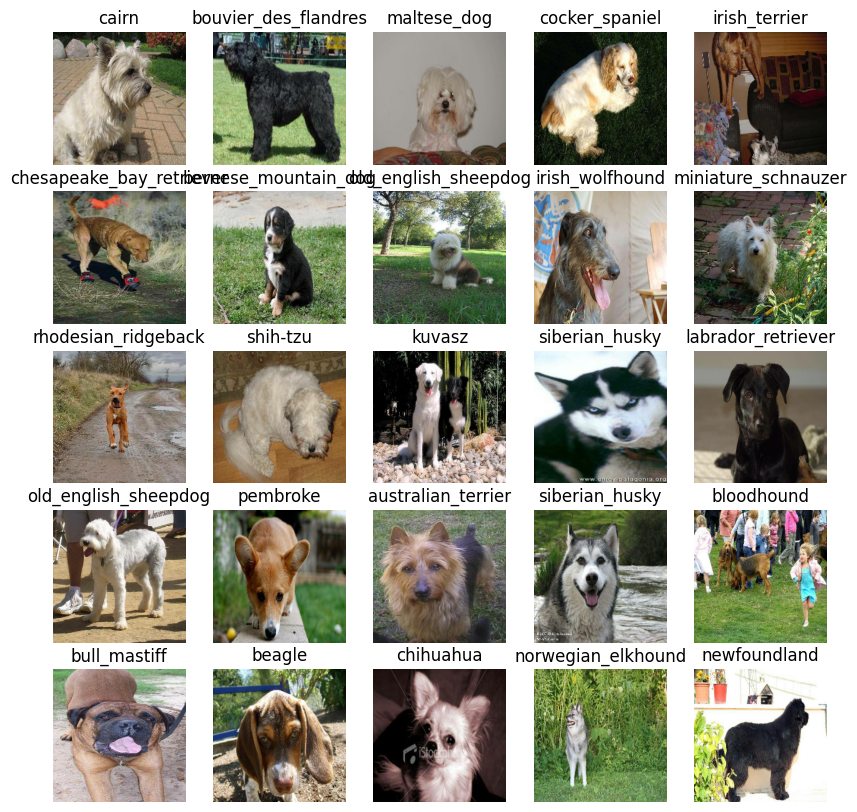

In [47]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

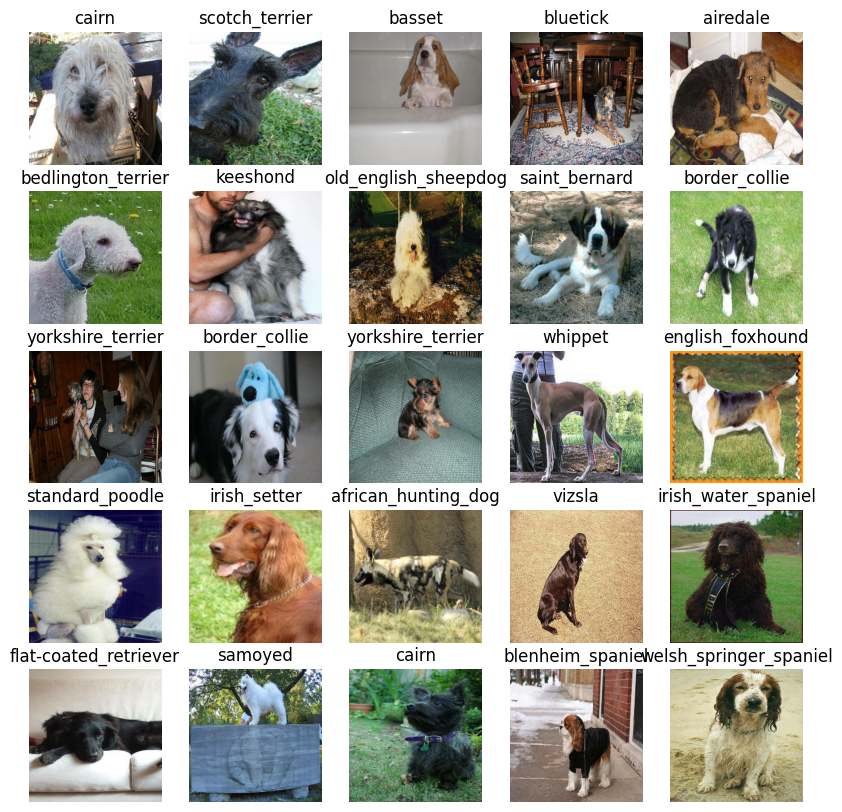

In [48]:
# Now let's visualize our validaition set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub -
https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2

In [42]:
IMG_SIZE

224

In [43]:
# Setup input shape to the model
INPUT_SHAPE = [IMG_SIZE, IMG_SIZE, 3]# batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5"



In [51]:
OUTPUT_SHAPE

120

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion
(do this first,then this, then that).
* Complies the model(says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [44]:
def create_model():
    # Load TF-Hub module once
    module = hub.load(MODEL_URL)  # returns a callable SavedModel

    # Wrap the hub module in a Lambda layer
    def hub_feature_vector(x):
        # Ensure float32 in [0,1]
        x = tf.image.convert_image_dtype(x, tf.float32)
        return module(x)

    inputs = tf.keras.Input(shape=INPUT_SHAPE)
    x = tf.keras.layers.Lambda(hub_feature_vector)(inputs)
    x = tf.keras.layers.Dropout(0.2)(x)
    outputs = tf.keras.layers.Dense(OUTPUT_SHAPE, activation='softmax')(x)

    model = tf.keras.Model(inputs, outputs)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(),
        loss=tf.keras.losses.CategoricalCrossentropy(),
        metrics=['accuracy']
    )
    return model

model = create_model()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 1664)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1664)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       199,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 199,800 (780.47 KB)

 Trainable params: 199,800 (780.47 KB)

 Non-trainable params: 0 (0.00 B)

## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()`function.
3. Visualize our models training logs with the `%tensorboard`
magic function (we'll do this after model training)


In [116]:
# Load TensorBoard notebook extension
%reload_ext tensorboard

In [117]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping CallBack

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [118]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## Training a model(on subset of data)
Our first model is only to train on 1000 images, to make sure everything is working.

In [119]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


In [121]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YES !!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


## Let's create a function which train a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()`function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [122]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given model and returns the trained version
  """
  # create a model
  model = create_model()

  # create new TensorBoard session everytime we train a model
  tensor_board = create_tensorboard_callback()

  # Fit the model to the data passing it the callback we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensor_board , early_stopping])
  # Return the fitted model
  return model

In [130]:
# Fit the model to the data
model = train_model()


Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 104s 4s/step - accuracy: 0.0561 - loss: 4.9197 - val_accuracy: 0.2900 - val_loss: 3.2075
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 119s 3s/step - accuracy: 0.7499 - loss: 1.7101 - val_accuracy: 0.5900 - val_loss: 1.9337
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.9651 - loss: 0.6275 - val_accuracy: 0.6700 - val_loss: 1.5061
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.9834 - loss: 0.3228 - val_accuracy: 0.6950 - val_loss: 1.3468
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 69s 3s/step - accuracy: 0.9945 - loss: 0.1983 - val_accuracy: 0.7000 - val_loss: 1.2816
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.9966 - loss: 0.1514 - val_accuracy: 0.7100 - val_loss: 1.2355
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 1.0000 - loss: 0.1098 - val_accuracy: 0.7050 - val_loss: 1.2089
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 1.0000 - loss: 0.0881 - val_accuracy: 0.7250 -

**Question** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`tensorboard`) will access the logs directly we created earlier and visualize its contents.

In [123]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Deep\ Learning/Dog-Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [60]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [108]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data,verbose = 1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 31s 4s/step


array([[0.0038651 , 0.0101573 , 0.02700004, ..., 0.00853499, 0.01127945,
        0.00789899],
       [0.00219483, 0.01461963, 0.01441957, ..., 0.00637376, 0.01304466,
        0.00416957],
       [0.00248933, 0.00112228, 0.01721496, ..., 0.00350439, 0.00501714,
        0.00382724],
       ...,
       [0.00303833, 0.00112488, 0.0022455 , ..., 0.01206146, 0.00996677,
        0.00086533],
       [0.00545625, 0.00495975, 0.01119028, ..., 0.00632666, 0.02012454,
        0.00798666],
       [0.00368063, 0.0039774 , 0.00427593, ..., 0.01155099, 0.00147136,
        0.00251123]], dtype=float32)

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [109]:
# Turn prediciton probablities into their respective label( easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Tuns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediciton probabilities
pred_level = get_pred_label(predictions[81])
pred_level

'walker_hound'

Now since our validation data is still in a batch data set
we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [128]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [62]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays
  of images and labels.
  """

  images =[]
  labels =[]
  # Loop throught unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels  = unbatchify (val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediciton probabilities, an array of truth labels and an array of images and an integers.
* Convert the prediction probabilitites to a predicted a label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot


In [ ]:
def plot_pred(prediction_probabilities, labels, images,n=1 ):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color ='red'

  # Change plot title to be predicted, probability of prediciton and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),color = color)


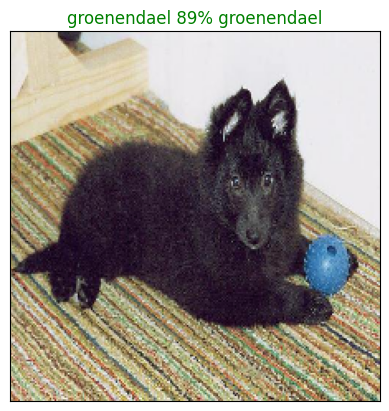

In [143]:
plot_pred(prediction_probabilities= predictions,
          labels= val_labels,
          images = val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 prediction

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction Labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidence along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 predicion labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass


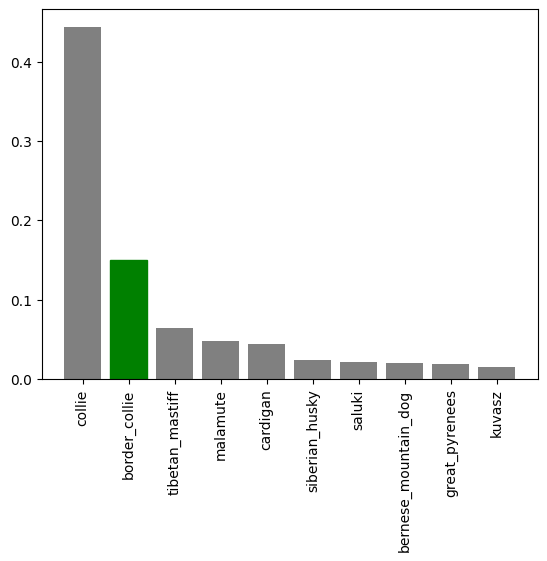

In [150]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our models, let's check out

In [ ]:
# Let's check out a few predictions and their different values
i_multiper = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i + i_multiper)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiper)
plt.tight_layout(h_pad=1.0)
plt.show()



** Challange:** How would you create a confusion matrix with our models predictions and true labels?


## Saving and reloading a trained model

In [47]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/Models',
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix +".keras" # save format of model
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path

In [48]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  def create_model():
    # Load TF-Hub module once
    module = hub.load(MODEL_URL)  # returns a callable SavedModel
    def hub_feature_vector(x):
      # must match the function name used when saving
      x = tf.image.convert_image_dtype(x, tf.float32)
      return module(x)
      print(f"Loading saved model from: {model_path}")
      model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"hub_feature_vector": hub_feature_vector}, safe_mode= False)


  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [167]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-feature-vector')


Saving model to: drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/Models/20250904-10061756980389-1000-images-mobilenetv2-feature-vector.keras....


'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/Models/20250904-10061756980389-1000-images-mobilenetv2-feature-vector.keras'

In [168]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/Models/20250904-10061756980389-1000-images-mobilenetv2-feature-vector.keras')

In [169]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.7370 - loss: 1.0437


[1.138654112815857, 0.7149999737739563]

In [170]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.7370 - loss: 1.0437


[1.138654112815857, 0.7149999737739563]

## Training a big dog model(on the full data)


In [63]:
len(X), len(y)

(10222, 10222)

In [64]:
X[:10]

['drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/train/0042188c895a2f14ef6

In [65]:
# Create a data batch with the full dataset
full_data = create_data_batches(X,y)


creating training data batches .... 


In [66]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [67]:
# Create a model for full model
full_model = create_model()

In [68]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note:** Running the cell below will take a little while
(maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory

In [69]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 4401s 14s/step - accuracy: 0.4786 - loss: 2.3978
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 128ms/step - accuracy: 0.8804 - loss: 0.4227
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 124ms/step - accuracy: 0.9290 - loss: 0.2697
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - accuracy: 0.9526 - loss: 0.1933
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - accuracy: 0.9706 - loss: 0.1368
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - accuracy: 0.9803 - loss: 0.1040
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - accuracy: 0.9869 - loss: 0.0837
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - accuracy: 0.9900 - loss: 0.0688
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - accuracy: 0.9913 - loss: 0.0558
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - accuracy: 0.9954 - loss: 0.0463
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - accuracy: 0.9957 - loss: 0.0386
Epoch 12

In [73]:
save_model(full_model, suffix = 'all-images-mobilenetv2-feature-vector')

Saving model to: drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/Models/20250904-13301756992611-all-images-mobilenetv2-feature-vector.keras....


'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/Models/20250904-13301756992611-all-images-mobilenetv2-feature-vector.keras'

In [49]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/Models/20250904-13301756992611-all-images-mobilenetv2-feature-vector.keras')

In [ ]:
len(X)

## Making predicitons on the test dataset

since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into same format.

Luckily we create `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data , we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have the labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [45]:
# Load test image filenames
test_path = "drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]


['drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/dd1eddb779b2611cdd42de48ae623a62.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/e6f07d64c2380bbde03a7b6ade01b859.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/e090f0f0ebc83ddf5f649a841493868b.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/e783e22d4f370b6cc0b1f44b4d6584a8.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/e4c743b9aaf615dd5fe162bf25f82fb5.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/e12731c30619c3fa4b0d9d9a76fb9d60.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/e298c484aa05012775db02f3596e1d18.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/e292584f17fa7cea7f95bdadecde0ebb.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/e2caef2df1087702936298aaac7843a1.jpg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/test/e79030be9c9769f3604474aea1603

In [50]:
len(test_filenames)

10357

In [51]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)
test_data

creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [52]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:* Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr)

In [54]:
# Make predictions on test data batch using the loaded full model
test_predicitions = loaded_full_model.predict(test_data,
                                              verbose = 1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 1564s 5s/step


In [58]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt('drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/preds_array.csv', test_predicitions, delimiter = ',')

In [59]:
# Load predictions (Numpy Array) from csv file
test_predicitions = np.loadtxt('drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/preds_array.csv', delimiter = ',')

In [60]:
test_predicitions

array([[0.01198178, 0.0024722 , 0.04480749, ..., 0.00267411, 0.01127097,
        0.00243969],
       [0.0074738 , 0.01132302, 0.01378565, ..., 0.00486338, 0.00344873,
        0.00193499],
       [0.00277814, 0.00250635, 0.00892689, ..., 0.00623077, 0.00475867,
        0.00667864],
       ...,
       [0.00158845, 0.00613891, 0.01844064, ..., 0.01074322, 0.00244196,
        0.00162636],
       [0.00203211, 0.00218509, 0.01361586, ..., 0.00378951, 0.00996925,
        0.00355834],
       [0.00336891, 0.00684751, 0.01820016, ..., 0.00383451, 0.00749688,
        0.00272987]])

In [61]:
test_predicitions.shape

(10357, 120)

## Preparing test dataset predictions for kaggle

Looking at the kaggle sample submission, we find that it wants our models prediction probability outputs in a Dataframe with an ID and a column for each different dog breed: https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll
* create a pandas Dataframe with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit to kaggle.

In [62]:
# Create  a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [67]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [68]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd1eddb779b2611cdd42de48ae623a62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e6f07d64c2380bbde03a7b6ade01b859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e090f0f0ebc83ddf5f649a841493868b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e783e22d4f370b6cc0b1f44b4d6584a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4c743b9aaf615dd5fe162bf25f82fb5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [69]:
# Add the prediction probabilites to each dog breed column
preds_df[list(unique_breeds)] = test_predicitions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd1eddb779b2611cdd42de48ae623a62,0.011982,0.002472,0.044807,0.008995,0.002235,0.006850,0.013445,0.021439,0.005168,...,0.001247,0.009600,0.002033,0.014081,0.008424,0.018280,0.003932,0.002674,0.011271,0.002440
1,e6f07d64c2380bbde03a7b6ade01b859,0.007474,0.011323,0.013786,0.011581,0.010964,0.009243,0.011746,0.008110,0.002533,...,0.004259,0.009687,0.002203,0.003773,0.002071,0.006976,0.004966,0.004863,0.003449,0.001935
2,e090f0f0ebc83ddf5f649a841493868b,0.002778,0.002506,0.008927,0.018633,0.009997,0.004355,0.014987,0.024692,0.004302,...,0.003037,0.006604,0.003378,0.006807,0.009073,0.015488,0.002496,0.006231,0.004759,0.006679
3,e783e22d4f370b6cc0b1f44b4d6584a8,0.002175,0.010833,0.008348,0.009575,0.004855,0.018136,0.010651,0.010352,0.002209,...,0.005606,0.011255,0.002575,0.002925,0.001393,0.004644,0.002629,0.003531,0.006163,0.002277
4,e4c743b9aaf615dd5fe162bf25f82fb5,0.003536,0.003214,0.016141,0.005290,0.005865,0.077923,0.014421,0.054945,0.011228,...,0.000910,0.007137,0.002978,0.010349,0.005937,0.011281,0.006100,0.006823,0.002786,0.005240


In [70]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv('drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/full_model_predictions_submission.csv',
                index = False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into databatches using `create_data_batches`. And since our custom image won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction lables.
* Compare the predicted labels to the custom images.

In [101]:
# Get the custom image filepaths
custom_path = "drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/my-dog-photos/2.jpeg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/my-dog-photos/3.jpeg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/my-dog-photos/4.jpeg',
 'drive/MyDrive/Colab Notebooks/Deep Learning/Dog-Vision/my-dog-photos/1.jpeg']

In [102]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [103]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step


In [105]:
custom_preds.shape

(4, 120)

In [112]:
# Get custom image prediciton labels
custom_preds_lables = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_lables

['borzoi', 'borzoi', 'french_bulldog', 'siberian_husky']

In [113]:
# Get custom image (our unbatchify() function won't work since there aren't labels... )
custom_images =[]
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

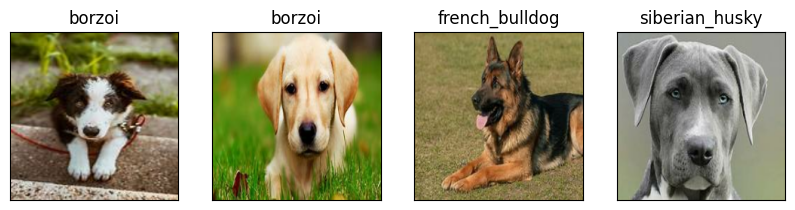

In [115]:
# Check custom image predicitons
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_lables[i])
  plt.imshow(image)